# Which clustering should we use now?

The one chosen by scMiko, Monocle3 or Silhouette width?

In [13]:
input_file = "/data/cephfs-1/home/users/cemo10_c/work/scRNA/scRNA_preprocessing_pipeline/results/chosen_branch/adata_subset_stripped.h5ad"
clusters_monocle3 = "/data/cephfs-1/home/users/cemo10_c/work/scRNA/scRNA_preprocessing_pipeline/results/chosen_branch/clusters_leiden_monocle3_subset.csv"
clusters_scmiko = "/data/cephfs-1/home/users/cemo10_c/work/scRNA/scRNA_preprocessing_pipeline/results/chosen_branch/clusters_scmiko_subset_chosen_res.csv"
clusters_silhouette = "/data/cephfs-1/home/users/cemo10_c/work/scRNA/scRNA_preprocessing_pipeline/results/chosen_branch/clusters_silhouette_chosen_res_subset.csv"

In [ ]:
# switch into project root directory for working links in interactive mode
import os
import re
os.chdir(re.sub('results/.*$', '', os.getcwd()))

import scanpy as sc
import pandas as pd

adata = sc.read(input_file)
adata.obs['clusters_monocle3'] = pd.read_csv(clusters_monocle3, index_col=0).astype('category')
adata.obs['clusters_scmiko'] = pd.read_csv(clusters_scmiko, index_col=0).astype('category')
adata.obs['clusters_silhouette'] = pd.read_csv(clusters_silhouette, index_col=0).astype('category')

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=80,
    facecolor="white",
    frameon=False,
    figsize=(6, 6),
)

# Custom plotting function
# adapted from https://github.com/scverse/scanpy/issues/2333#issuecomment-1563790561
def split_dim_plot(adata, split_by, embedding="umap", color=None, ncol=5, nrow=None, **kwargs):
    size = 120000 / len(adata.obs_names) * len(adata.obs[split_by].unique()) / 1.2  # Keep point size constant
    categories = adata.obs[split_by].cat.categories
    if nrow is None:
        nrow = int(np.ceil(len(categories) / ncol))
    
    # Update global font sizes
    plt.rcParams.update({
        "font.size": 14,  # General font size
        "axes.titlesize": 18,  # Subplot title size
        "legend.fontsize": 14,  # Legend font size
        "xtick.labelsize": 14,  # X-axis labels
        "ytick.labelsize": 14   # Y-axis labels
    })
    
    fig, axs = plt.subplots(nrow, ncol, figsize=(5*ncol, 5*nrow))
    axs = axs.flatten()

    # Plot individual subplots
    for i, cat in enumerate(categories):
        ax = axs[i]
        
        # Plot background (all cells in light gray)
        sc.pl.embedding(adata, basis=embedding, color=None, size=size, show=False, ax=ax, na_color="#EEEEEE")
        
        # Plot current category with color
        sc.pl.embedding(
            adata[adata.obs[split_by] == cat], 
            basis=embedding, 
            color=color, 
            ax=ax, 
            show=False, 
            title=cat, 
            size=size, 
            legend_loc=None,  # Remove individual legends
            **kwargs
        )
    
        ax.set_title(cat, fontsize=18)  # Set larger font for subplot titles

    # Hide unused subplots if any
    for j in range(i + 1, len(axs)):
        axs[j].axis("off")

    # Create common legend
    if color and color in adata.obs:
        unique_categories = adata.obs[color].cat.categories
        colors = adata.uns.get(color + "_colors", plt.cm.tab10(range(len(unique_categories))))  # Get colors
        
        legend_patches = [plt.Line2D([0], [0], marker="o", color="w", markerfacecolor=c, markersize=12, label=cat)
                          for cat, c in zip(unique_categories, colors)]

        fig.legend(handles=legend_patches, loc="lower center", ncol=min(len(unique_categories), 5), fontsize=16)  # Bigger legend
        unique_categories = adata.obs[color].cat.categories
        colors = adata.uns.get(color + "_colors", plt.cm.tab10(range(len(unique_categories))))  # Get colors
        
        legend_patches = [plt.Line2D([0], [0], marker="o", color="w", markerfacecolor=c, markersize=12, label=cat)
                          for cat, c in zip(unique_categories, colors)]

        fig.legend(handles=legend_patches, loc="lower center", ncol=min(len(unique_categories), 5), fontsize=16)  # Bigger legend

    # Adjust layout to make space for legend
    plt.tight_layout(rect=[0, 0.05, 1, 1])

    # plt.show()

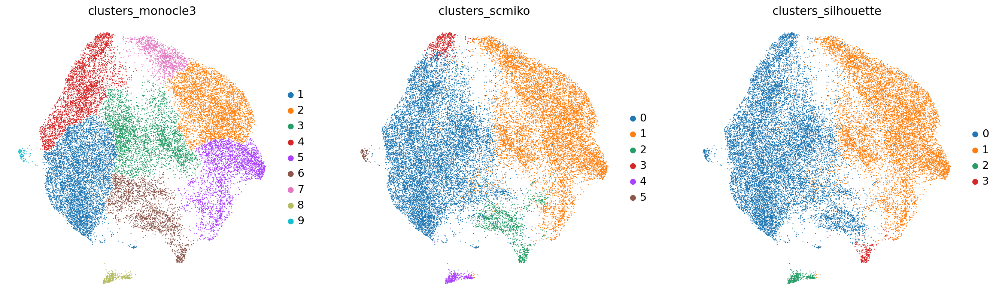

In [ ]:
sc.pl.umap(adata, color = ['clusters_monocle3', 'clusters_scmiko', 'clusters_silhouette'])

clusters_monocle3
clusters_scmiko
clusters_silhouette


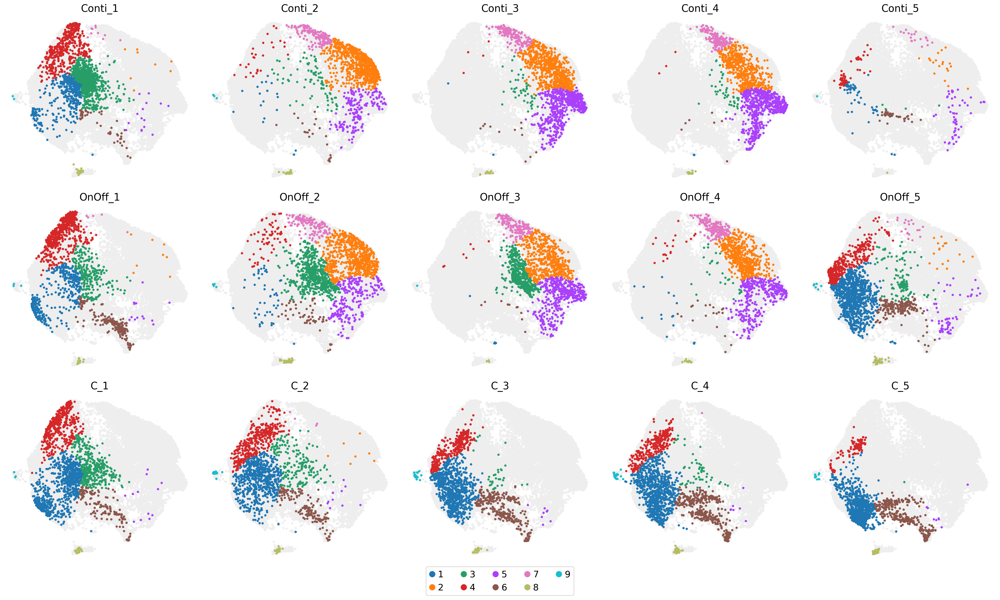

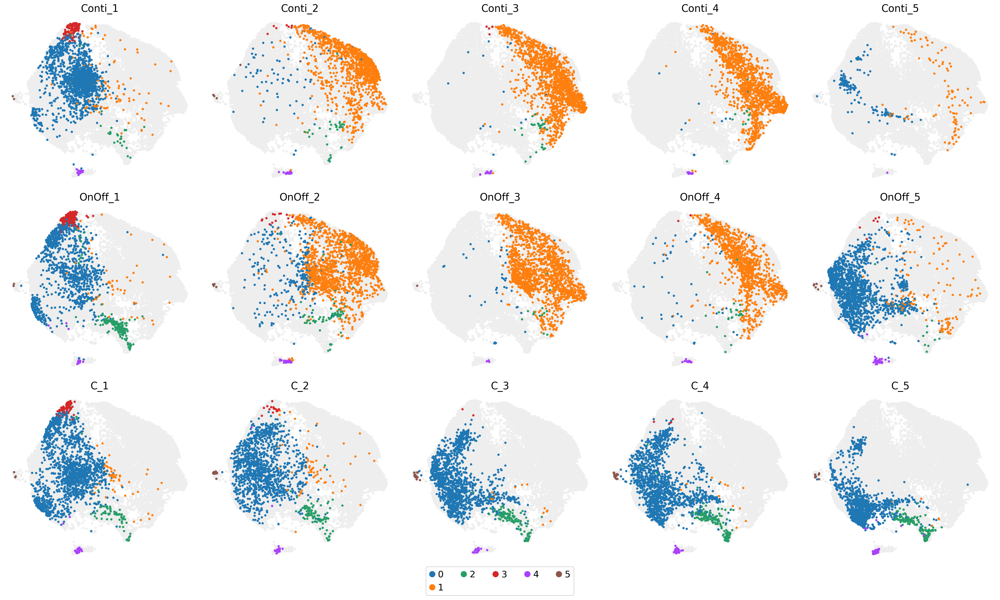

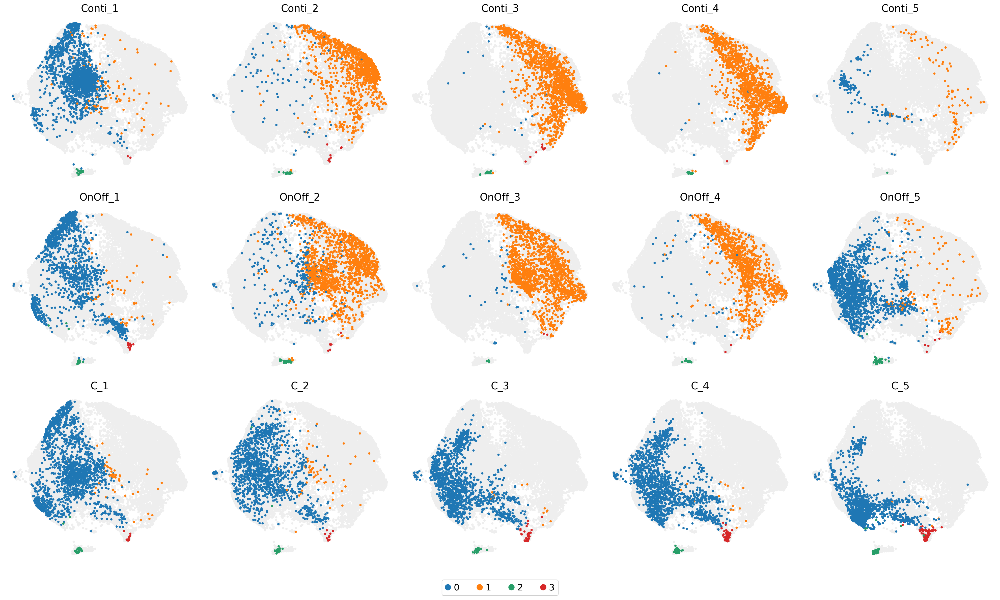

In [10]:
for clustering in ['clusters_monocle3', 'clusters_scmiko', 'clusters_silhouette']:
    print(clustering)
    split_dim_plot(adata, split_by = 'sample', color=clustering, ncol=5)